# Descripción general del trabajo con imágenes

Al aprovechar el poder de algunas bibliotecas comunes que puede instalar, como PILLOW, Python obtiene la capacidad de trabajar y manipular imágenes para tareas simples. Puede instalar Pillow ejecutando:

      pip install pillow
    
En caso de problemas, puede consultar su [documentación oficial] (http://pillow.readthedocs.io/en/3.4.x/installation.html) sobre la instalación. Pero para la mayoría de las computadoras, el método simple de instalación de pip debería funcionar.

---
____
**Nota: cuando trabaje con imágenes en el notebook jupyter, es posible que reciba la siguiente advertencia:**

     Se excedió la velocidad de datos de IOPub.
     El servidor del portátil dejará de enviar resultados temporalmente.
     al cliente para evitar bloquearlo.
     Para cambiar este límite, establezca la variable de configuración
     `--NotebookApp.iopub_data_rate_limit`.
    
**Si recibe esta advertencia, intente detener la computadora portátil en la línea de comando y luego reiníciela con:**

     jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10
    
** En la línea de comando. Básicamente, esto agrega una "bandera" que indica que el límite debe elevarse durante esta sesión de jupyter notebook que está ejecutando. **


----

# Trabajando con la biblioteca de PILLOW

## Abriendo Imágenes

Puede usar Pillow para abrir archivos de imagen. Para un jupyter notebook, para mostrar el archivo, simplemente escriba el nombre de la variable que contiene la imagen. Para otros IDE, la variable de imagen tendrá un método [.show().](https://stackoverflow.com/questions/28139637/how-can-i-display-an-image-using-pillow)

In [1]:
from PIL import Image

In [2]:
mac = Image.open('ejemplo.jpg')

In [3]:
# Tenga en cuenta que este es un tipo de archivo especializado de PIL (pillow)
type(mac)

PIL.JpegImagePlugin.JpegImageFile

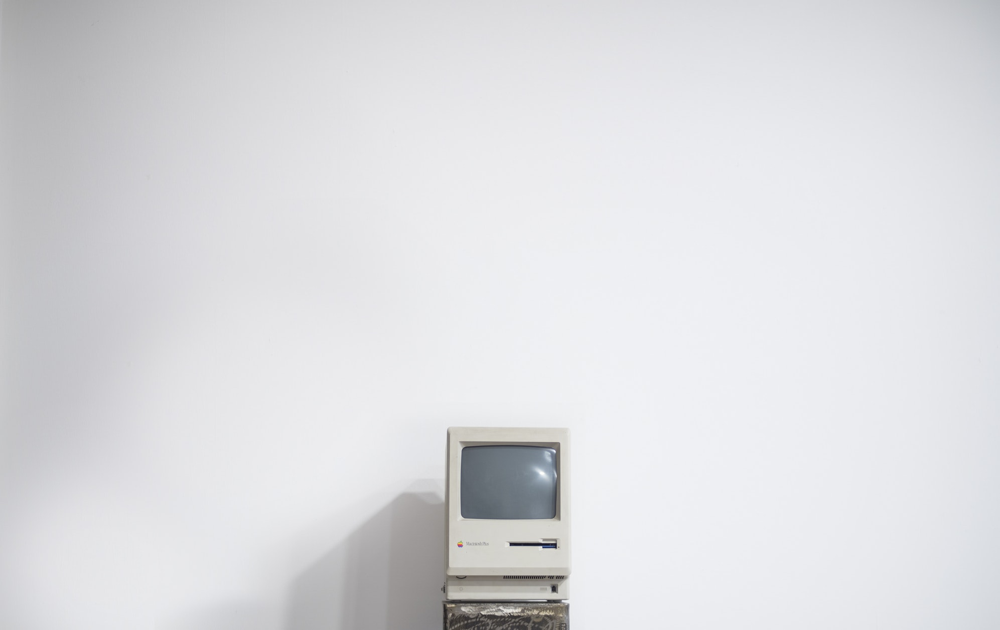

In [4]:
# Solo para jupyter notebook , use mac.show() for other IDEs 
mac

### Image Information

In [5]:
# (ancho,alto)
mac.size

(1993, 1257)

In [6]:
mac.filename

'ejemplo.jpg'

In [7]:
mac.format_description

'JPEG (ISO 10918)'

## Recortar imágenes

Para recortar imágenes (es decir, capturar una subsección), puede usar el método crop() en el objeto de la imagen. El método crop() devuelve una región rectangular de esta imagen. El cuadro es una tupla de 4 que define la coordenada de píxeles izquierda, superior, derecha e inferior.

¡Nota! Si echa un vistazo a la cadena de documentación, dice que la tupla que pasa está definida como (x,y,w,h). Estas variables pueden ser un poco engañosas. No es realmente una altura o un ancho lo que se está pasando, sino las coordenadas finales de su ancho y alto.


Todas las coordenadas del cuadro (x, y, w, h) se miden desde la esquina superior izquierda de la imagen. De nuevo, ¡los 4 valores son coordenadas!

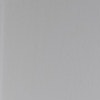

In [8]:
mac.crop((0,0,100,100))

Para la imagen de mac, esta no es una demostración muy útil. Usemos otra imagen en su lugar:

In [9]:
lapices = Image.open("lapices.jpg")

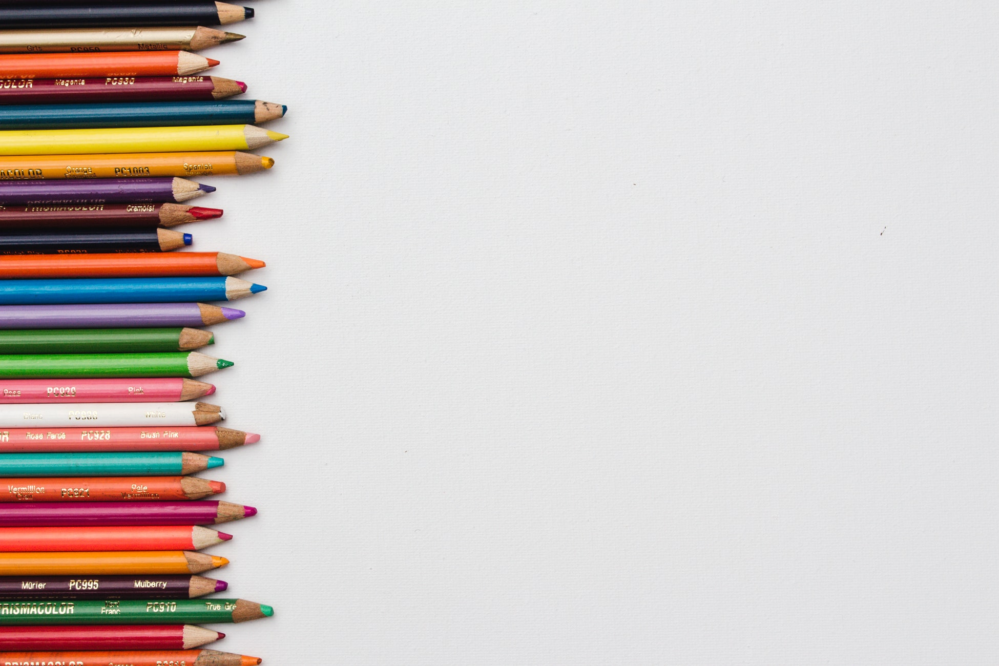

In [10]:
lapices

Ahora intentemos agarrar algunos de los lápices superiores de la esquina.

In [11]:
lapices.size

(1950, 1300)

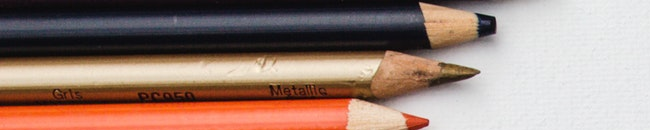

In [12]:
# Empieza en la esquina superior (0,0)
x = 0
y = 0

# Toma casi 10% en la direccion y, y casi 30% en la direccion x
w = 1950/3
h = 1300/10

lapices.crop((x,y,w,h))

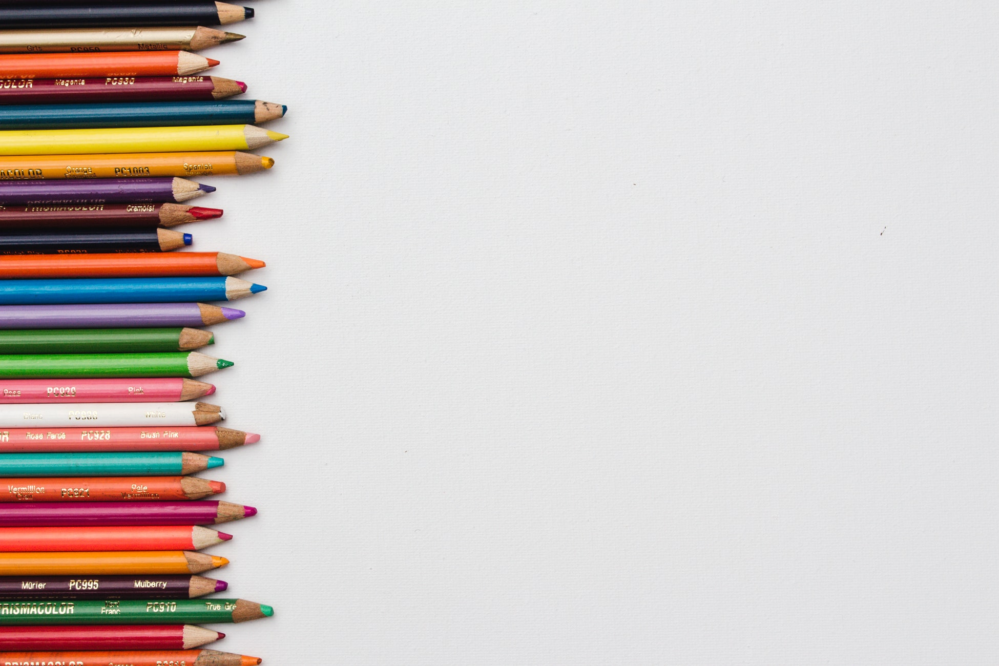

In [13]:
lapices

Ahora probemos los lápices desde abajo.

In [14]:
lapices.size

(1950, 1300)

In [15]:
x = 0 
y = 1100
w = 1950/3
h = 1300

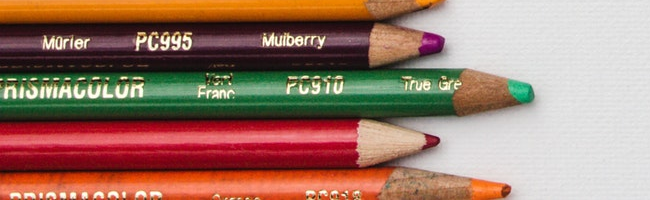

In [16]:
lapices.crop((x,y,w,h))

Ahora volvamos a la foto de mac y veamos si solo podemos agarrar la computadora en sí:

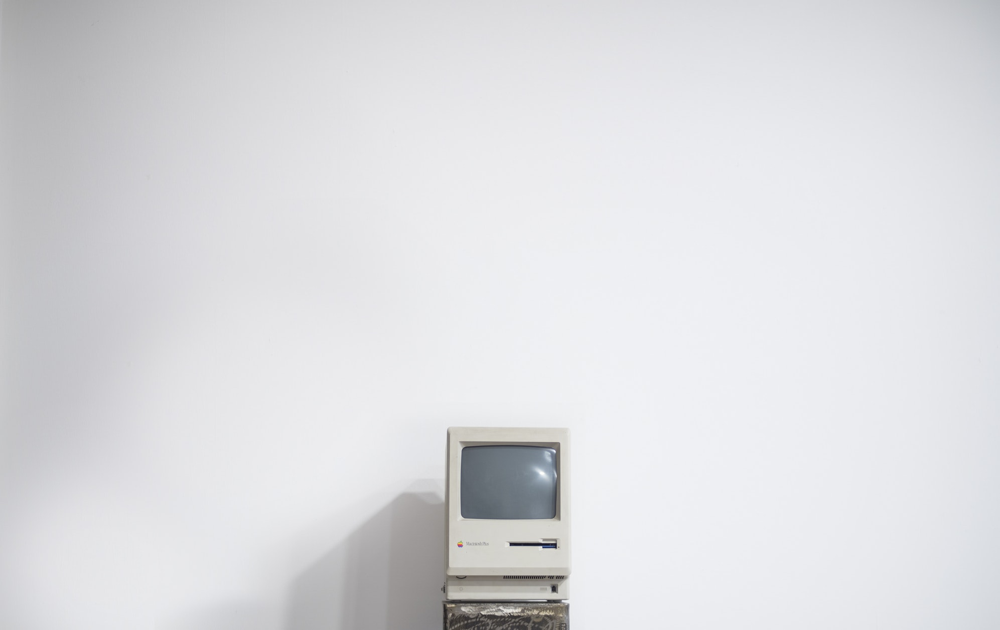

In [17]:
mac

In [18]:
mac.size

(1993, 1257)

In [19]:
intermedio = 1993/2

In [20]:
x = intermedio - 200
w = intermedio + 200

In [21]:
y = 800
h = 1257

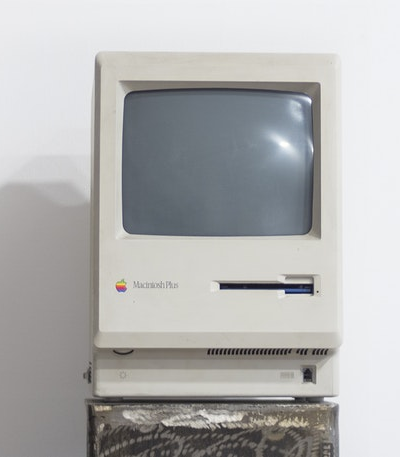

In [22]:
mac.crop((x,y,w,h))

### Copiar y pegar imágenes

Podemos crear copias con el método copy() y pegar imágenes encima de otras con el método paste().

In [23]:
computadora = mac.crop((x,y,w,h))

In [24]:
mac.paste(im=computadora,box=(0,0))

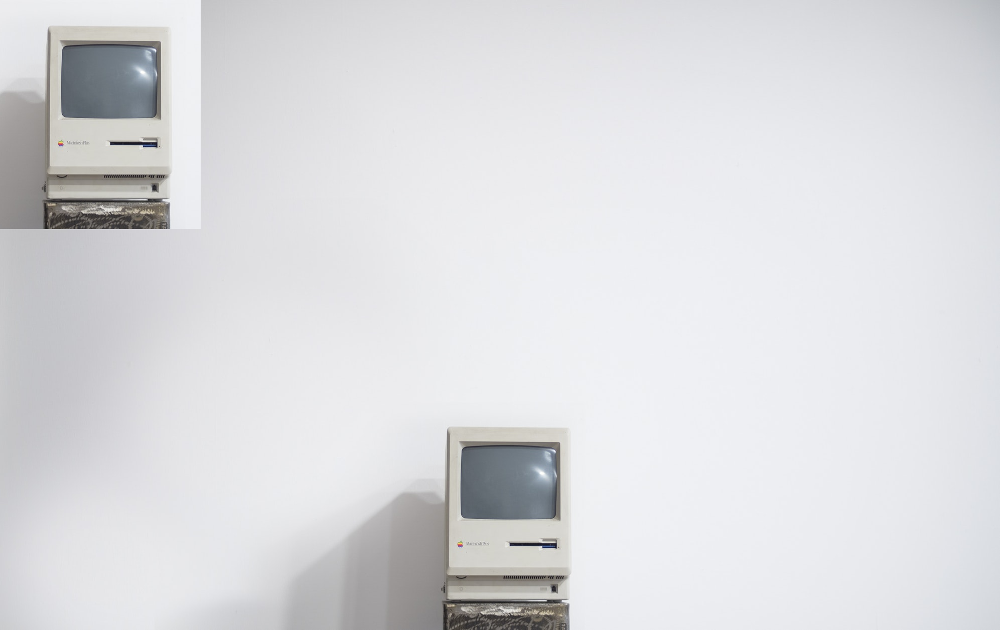

In [25]:
mac

In [26]:
mac.paste(im=computadora,box=(796,0))

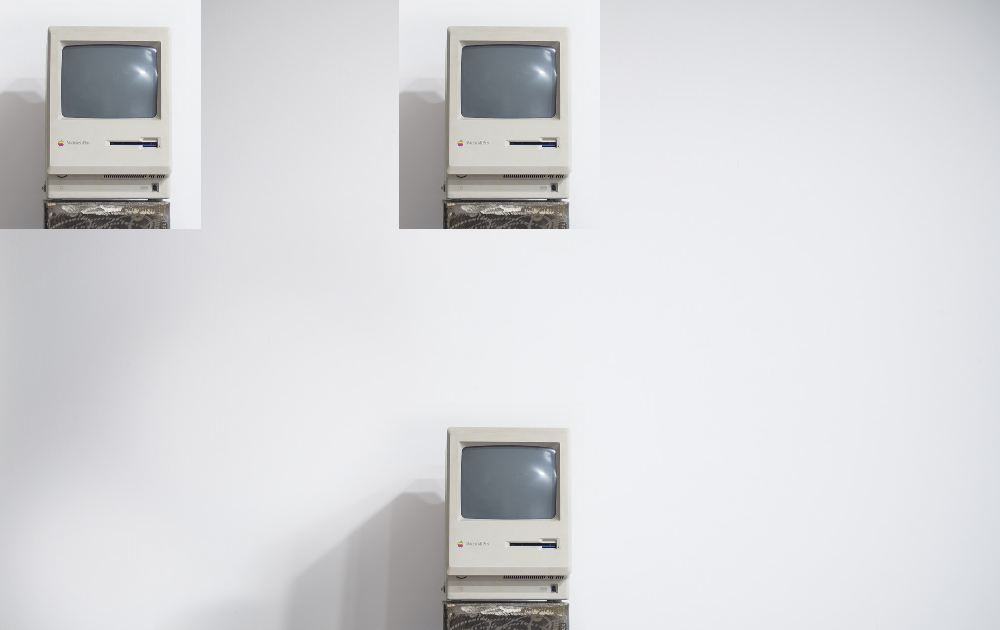

In [27]:
mac

### Cambio de tamaño

Puede usar el método resize() para cambiar el tamaño de una imagen

In [28]:
mac.size

(1993, 1257)

In [29]:
h,w = mac.size

In [30]:
new_h = int(h/3)
new_w = int(w/3)

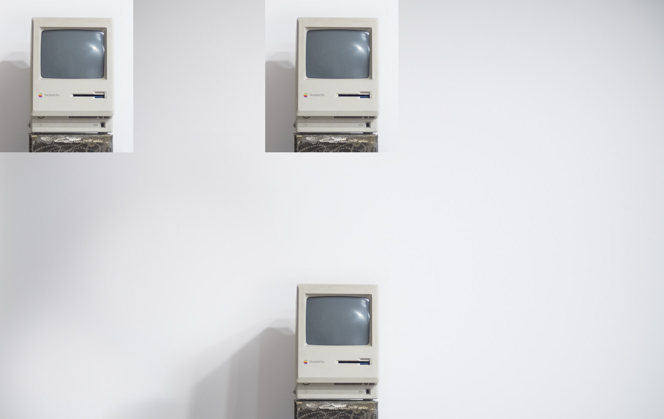

In [31]:
# Tenga en cuenta que este no es un cambio permanente
# para un cambio permanente, haz una reasignación
# p.ej. mac = mac.resize((100,100))
mac.resize((new_h,new_w))

También se puede estirar y apretar

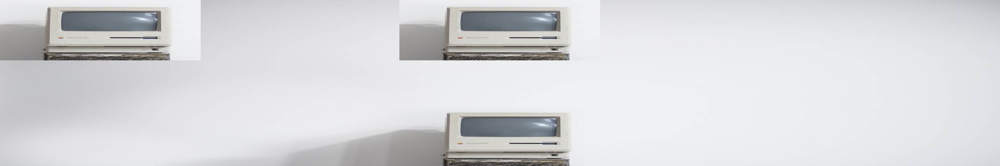

In [32]:
mac.resize((3000,500))

### Rotación de imágenes

Puede rotar imágenes especificando la cantidad de grados para rotar en el método de rotate(). Las dimensiones originales se mantendrán y se "rellenarán" con negro. Opcionalmente, puede pasar el parámetro de expansión para llenar la nueva imagen girada a las dimensiones anteriores.

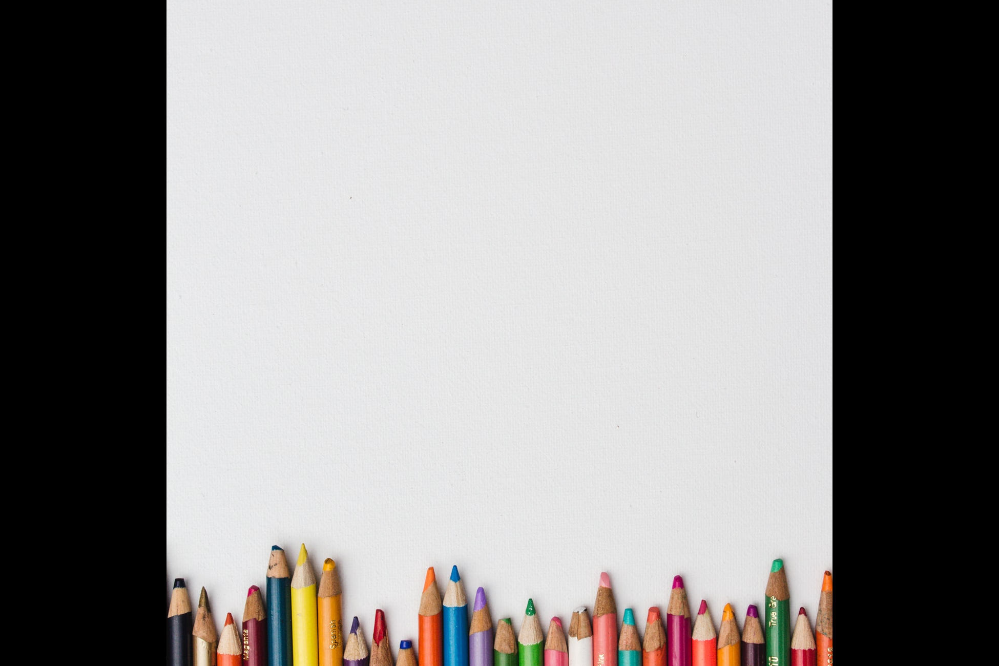

In [33]:
lapices.rotate(90)

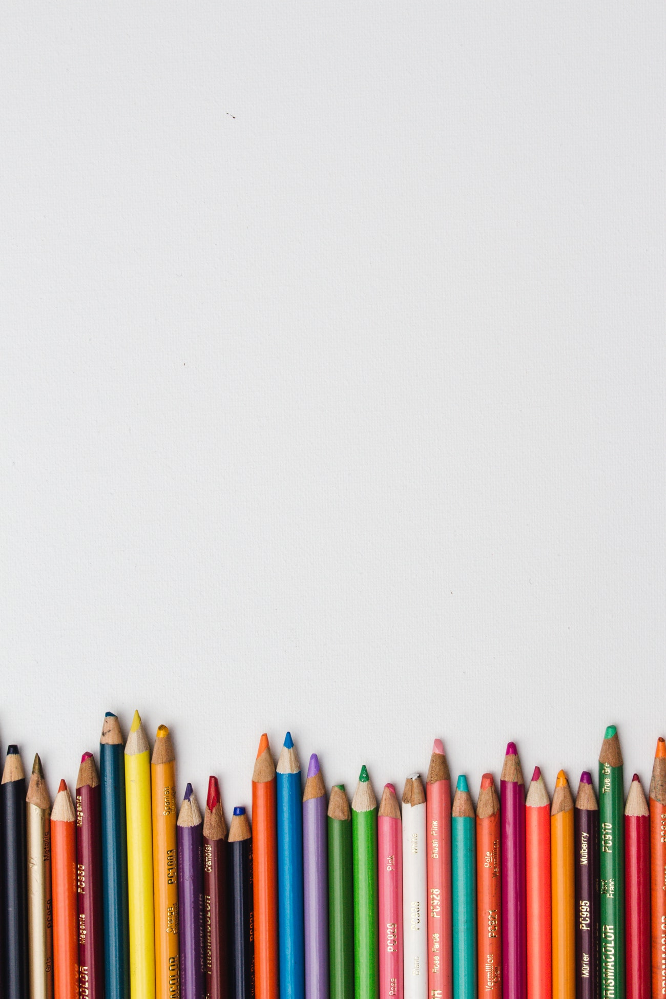

In [34]:
lapices.rotate(90,expand=True)

Observe lo que sucede cuando rotamos 120.

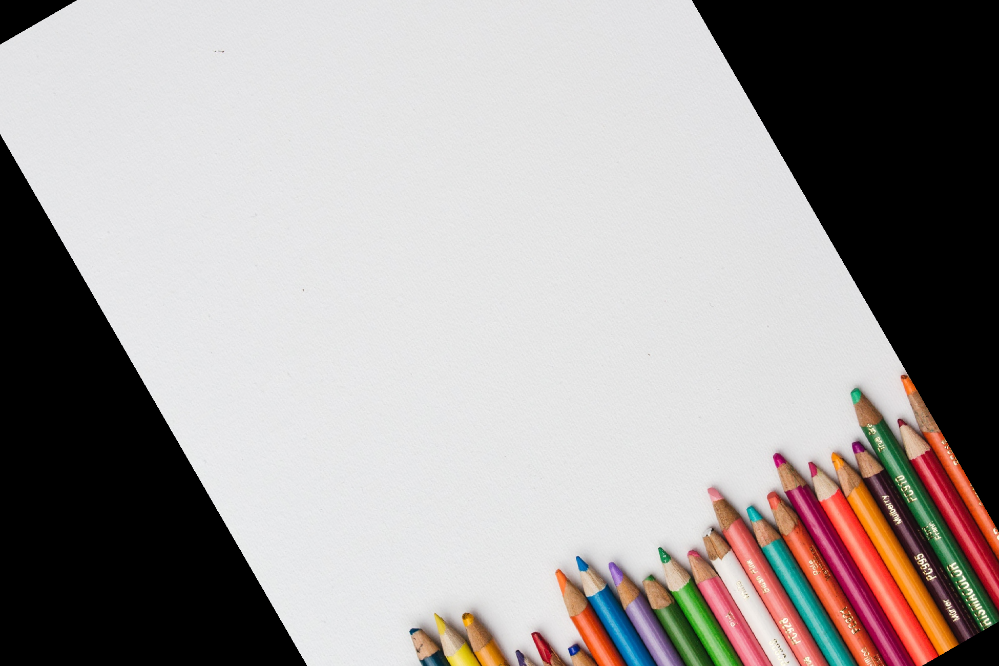

In [35]:
# La imagen es cortada
lapices.rotate(120)

In [36]:
#lapices.rotate(120,expand=True)

## Transparencia

Podemos agregar un valor alfa (RGBA significa ROJO, Verde, Azul, Alfa) donde los valores pueden ir de 0 a 255. Si Alfa es 0, la imagen es completamente transparente, si es 255, entonces es completamente opaca.

Puede crear su propio color aquí para comprobar los posibles valores: https://developer.mozilla.org/en-US/docs/Web/CSS/CSS_Colors/Color_picker_tool

Podemos ajustar los valores alfa de la imagen con el método putalpha():

In [37]:
rojo = Image.open('color_rojo.jpg')

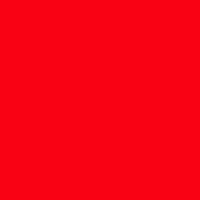

In [38]:
rojo

In [39]:
azul = Image.open('color_azul.png')

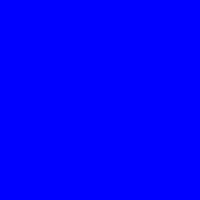

In [40]:
azul

In [41]:
rojo.putalpha(128)

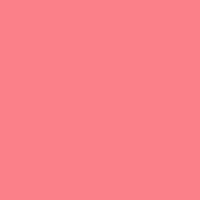

In [42]:
rojo

La transparencia y el enmascaramiento pueden ser mucho más complejos de lo que mostramos aquí, si necesita algo más, consulte la documentación: https://pillow.readthedocs.io/en/stable/

Gran trabajo!